# AI-Generated Video Detection & Analysis

This notebook provides tools to analyze videos and detect potential signs of AI generation. While no method is 100% accurate, this combines multiple analysis techniques to identify common artifacts in AI-generated videos.

## Analysis Methods

1. **GPT-4o Vision Analysis** - Analyze frames for unnatural patterns, artifacts, and inconsistencies
2. **Temporal Consistency** - Check for frame-to-frame coherence issues
3. **Motion Analysis** - Detect unnatural or physically impossible movements
4. **Artifact Detection** - Look for common AI generation artifacts (blurring, warping, text issues)
5. **Metadata Analysis** - Check video metadata for generation signatures

## Limitations

- AI detection is an evolving field; no method is perfect
- High-quality AI videos can be very difficult to detect
- Results should be interpreted as indicators, not definitive proof
- Human review is always recommended

## Prerequisites

- Azure OpenAI access with GPT-4o Vision model
- Python packages: opencv-python, pillow, numpy, openai, python-dotenv

## Setup and Configuration

In [1]:
# Install required packages
#%pip install opencv-python pillow numpy openai python-dotenv matplotlib

In [2]:
import os
import cv2
import numpy as np
from pathlib import Path
from dotenv import load_dotenv
from openai import OpenAI
import base64
from io import BytesIO
from PIL import Image
import json
from datetime import datetime
import matplotlib.pyplot as plt
from IPython.display import Video, display, HTML, Markdown

# Load environment variables
load_dotenv('.env')

# Configuration
AZURE_OPENAI_ENDPOINT = os.getenv("AZURE_OPENAI_ENDPOINT")
AZURE_OPENAI_API_KEY = os.getenv("AZURE_OPENAI_API_KEY")

# Validate credentials
if not AZURE_OPENAI_ENDPOINT or not AZURE_OPENAI_API_KEY:
    raise ValueError("Please set AZURE_OPENAI_ENDPOINT and AZURE_OPENAI_API_KEY in .env file")

# Initialize OpenAI client
client = OpenAI(
    api_key=AZURE_OPENAI_API_KEY,
    base_url=AZURE_OPENAI_ENDPOINT,
)

# Create output directories
Path("analysis_results").mkdir(exist_ok=True)
Path("extracted_frames").mkdir(exist_ok=True)

print("✅ Configuration loaded and client initialized")

✅ Configuration loaded and client initialized


## Helper Functions for Frame Extraction and Analysis

In [3]:
def extract_frames_from_video(video_path, num_frames=10, output_dir="extracted_frames"):
    """
    Extract evenly distributed frames from a video
    
    Args:
        video_path: Path to video file
        num_frames: Number of frames to extract
        output_dir: Directory to save extracted frames
    
    Returns:
        List of frame file paths
    """
    video = cv2.VideoCapture(str(video_path))
    total_frames = int(video.get(cv2.CAP_PROP_FRAME_COUNT))
    fps = video.get(cv2.CAP_PROP_FPS)
    duration = total_frames / fps if fps > 0 else 0
    
    print(f"📹 Video Info:")
    print(f"   Total frames: {total_frames}")
    print(f"   FPS: {fps:.2f}")
    print(f"   Duration: {duration:.2f}s")
    print(f"   Resolution: {int(video.get(cv2.CAP_PROP_FRAME_WIDTH))}x{int(video.get(cv2.CAP_PROP_FRAME_HEIGHT))}")
    print()
    
    # Calculate frame indices to extract
    if num_frames > total_frames:
        num_frames = total_frames
    
    frame_indices = np.linspace(0, total_frames - 1, num_frames, dtype=int)
    
    frame_paths = []
    output_path = Path(output_dir)
    output_path.mkdir(exist_ok=True)
    
    print(f"🎬 Extracting {num_frames} frames...")
    
    for idx, frame_idx in enumerate(frame_indices):
        video.set(cv2.CAP_PROP_POS_FRAMES, frame_idx)
        ret, frame = video.read()
        
        if ret:
            frame_filename = output_path / f"frame_{idx:03d}_at_{frame_idx}.jpg"
            cv2.imwrite(str(frame_filename), frame)
            frame_paths.append(str(frame_filename))
            print(f"   ✓ Frame {idx + 1}/{num_frames} saved")
    
    video.release()
    print(f"✅ Extracted {len(frame_paths)} frames\n")
    
    return frame_paths, {
        "total_frames": total_frames,
        "fps": fps,
        "duration": duration,
        "resolution": f"{int(video.get(cv2.CAP_PROP_FRAME_WIDTH))}x{int(video.get(cv2.CAP_PROP_FRAME_HEIGHT))}"
    }


def encode_image_to_base64(image_path):
    """Encode image to base64 for GPT-4 Vision API"""
    with open(image_path, "rb") as image_file:
        return base64.b64encode(image_file.read()).decode('utf-8')


def calculate_frame_difference(frame1_path, frame2_path):
    """Calculate the difference between two consecutive frames"""
    img1 = cv2.imread(frame1_path)
    img2 = cv2.imread(frame2_path)
    
    if img1 is None or img2 is None:
        return None
    
    # Calculate mean squared error
    mse = np.mean((img1.astype(float) - img2.astype(float)) ** 2)
    return mse


def detect_motion_blur(image_path):
    """Detect motion blur in an image using Laplacian variance"""
    image = cv2.imread(image_path)
    gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
    
    # Calculate Laplacian variance (lower = more blurry)
    laplacian_var = cv2.Laplacian(gray, cv2.CV_64F).var()
    
    return laplacian_var

print("✅ Frame extraction and analysis functions defined")

✅ Frame extraction and analysis functions defined


## GPT-4o Vision Analysis Functions

In [4]:
def analyze_frame_with_gpt4_vision(image_path, analysis_focus="ai_detection"):
    """
    Use GPT-4o Vision to analyze a frame for AI generation signs
    
    Args:
        image_path: Path to the image frame
        analysis_focus: Type of analysis ("ai_detection", "artifacts", "consistency")
    
    Returns:
        Analysis result as dictionary
    """
    base64_image = encode_image_to_base64(image_path)
    
    if analysis_focus == "ai_detection":
        prompt = """Analyze this video frame carefully for signs that it may have been AI-generated. Look for:

1. **Unnatural Artifacts**: Blurring, warping, distortions, especially around edges or complex areas
2. **Anatomical Issues**: If people/animals present - unusual proportions, extra/missing fingers, distorted features
3. **Physics Violations**: Impossible shadows, lighting inconsistencies, unnatural reflections
4. **Text/Writing**: Garbled, nonsensical, or distorted text if present
5. **Background Inconsistencies**: Unnatural patterns, repetitive elements, blending issues
6. **Temporal Impossibilities**: Objects that shouldn't exist together, anachronistic elements
7. **Overall Quality**: Overly smooth/perfect areas mixed with artifacts

Provide a structured analysis:
- **Likelihood of AI Generation**: High/Medium/Low
- **Confidence**: 0-100%
- **Key Indicators**: List specific observations
- **Natural Elements**: What appears authentic
- **Verdict**: Brief summary

Be analytical and specific. If uncertain, state why."""
    
    elif analysis_focus == "artifacts":
        prompt = """Examine this frame specifically for visual artifacts commonly found in AI-generated videos:

1. Blending artifacts around object boundaries
2. Warping or distortion in fine details
3. Inconsistent texture patterns
4. Unnatural color gradients or banding
5. Strange geometric patterns
6. Temporal ghosting or duplication

List any artifacts found with location and severity."""
    
    else:  # consistency
        prompt = """Analyze this frame for internal consistency:

1. Lighting direction and quality
2. Perspective and depth consistency
3. Object scale relationships
4. Shadow accuracy
5. Reflection plausibility
6. Overall coherence

Identify any inconsistencies that suggest artificial generation."""
    
    try:
        response = client.chat.completions.create(
            model="gpt-4o",
            messages=[
                {
                    "role": "user",
                    "content": [
                        {"type": "text", "text": prompt},
                        {
                            "type": "image_url",
                            "image_url": {"url": f"data:image/jpeg;base64,{base64_image}"}
                        }
                    ]
                }
            ],
            max_tokens=1000,
            temperature=0.3
        )
        
        analysis = response.choices[0].message.content
        return {
            "success": True,
            "analysis": analysis,
            "focus": analysis_focus
        }
    
    except Exception as e:
        return {
            "success": False,
            "error": str(e),
            "focus": analysis_focus
        }


def analyze_multiple_frames_for_consistency(frame_paths):
    """
    Analyze multiple frames together for temporal consistency
    
    Args:
        frame_paths: List of paths to frame images (max 4 for API limits)
    
    Returns:
        Consistency analysis result
    """
    # Limit to 4 frames for API constraints
    selected_frames = frame_paths[:4] if len(frame_paths) > 4 else frame_paths
    
    # Encode all frames
    encoded_frames = [encode_image_to_base64(fp) for fp in selected_frames]
    
    prompt = f"""Analyze these {len(selected_frames)} frames from a video sequence for temporal consistency and signs of AI generation:

1. **Frame-to-Frame Continuity**: Do objects, people, backgrounds transition naturally?
2. **Motion Consistency**: Is movement fluid or are there jumps, warping, or morphing?
3. **Identity Preservation**: Do people/objects maintain consistent appearance?
4. **Lighting/Shadow Changes**: Are they physically plausible across frames?
5. **AI Artifacts Across Time**: Do any glitches or artifacts appear/disappear unnaturally?

Provide:
- **Temporal Consistency Score**: 0-10 (10 = perfectly consistent)
- **AI Generation Likelihood**: High/Medium/Low across the sequence
- **Specific Issues**: List any temporal inconsistencies
- **Overall Assessment**: Is this likely AI-generated based on temporal analysis?

Be specific about what changes unnaturally between frames."""
    
    try:
        content = [{"type": "text", "text": prompt}]
        for encoded_frame in encoded_frames:
            content.append({
                "type": "image_url",
                "image_url": {"url": f"data:image/jpeg;base64,{encoded_frame}"}
            })
        
        response = client.chat.completions.create(
            model="gpt-4o",
            messages=[{"role": "user", "content": content}],
            max_tokens=1200,
            temperature=0.3
        )
        
        return {
            "success": True,
            "analysis": response.choices[0].message.content,
            "frames_analyzed": len(selected_frames)
        }
    
    except Exception as e:
        return {
            "success": False,
            "error": str(e),
            "frames_analyzed": 0
        }

print("✅ GPT-4o Vision analysis functions defined")

✅ GPT-4o Vision analysis functions defined


## Technical Analysis Functions

In [5]:
def analyze_temporal_consistency(frame_paths):
    """
    Analyze frame-to-frame differences for unusual jumps
    
    Returns:
        Dictionary with consistency metrics
    """
    if len(frame_paths) < 2:
        return {"error": "Need at least 2 frames for temporal analysis"}
    
    differences = []
    for i in range(len(frame_paths) - 1):
        diff = calculate_frame_difference(frame_paths[i], frame_paths[i + 1])
        if diff is not None:
            differences.append(diff)
    
    if not differences:
        return {"error": "Could not calculate frame differences"}
    
    mean_diff = np.mean(differences)
    std_diff = np.std(differences)
    max_diff = np.max(differences)
    
    # Detect unusual spikes (potential AI artifacts or cuts)
    threshold = mean_diff + (2 * std_diff)
    anomalies = [i for i, d in enumerate(differences) if d > threshold]
    
    return {
        "mean_difference": float(mean_diff),
        "std_deviation": float(std_diff),
        "max_difference": float(max_diff),
        "anomaly_frames": anomalies,
        "consistency_score": max(0, 100 - (std_diff / mean_diff * 100)) if mean_diff > 0 else 0,
        "interpretation": "High" if std_diff / mean_diff < 0.5 else "Medium" if std_diff / mean_diff < 1.0 else "Low"
    }


def analyze_blur_consistency(frame_paths):
    """
    Analyze blur/sharpness across frames
    AI-generated videos may have inconsistent sharpness
    """
    blur_scores = []
    
    for frame_path in frame_paths:
        score = detect_motion_blur(frame_path)
        blur_scores.append(score)
    
    mean_blur = np.mean(blur_scores)
    std_blur = np.std(blur_scores)
    
    return {
        "mean_sharpness": float(mean_blur),
        "std_sharpness": float(std_blur),
        "sharpness_scores": [float(s) for s in blur_scores],
        "consistency": "Good" if std_blur / mean_blur < 0.3 else "Inconsistent",
        "interpretation": "Inconsistent sharpness may indicate AI generation or quality issues"
    }


def extract_video_metadata(video_path):
    """
    Extract and analyze video metadata
    Some AI-generated videos may lack typical camera metadata
    """
    video = cv2.VideoCapture(str(video_path))
    
    metadata = {
        "codec": video.get(cv2.CAP_PROP_FOURCC),
        "fps": video.get(cv2.CAP_PROP_FPS),
        "frame_count": int(video.get(cv2.CAP_PROP_FRAME_COUNT)),
        "width": int(video.get(cv2.CAP_PROP_FRAME_WIDTH)),
        "height": int(video.get(cv2.CAP_PROP_FRAME_HEIGHT)),
    }
    
    video.release()
    
    # Check file metadata if available
    file_path = Path(video_path)
    metadata["file_size_mb"] = file_path.stat().st_size / (1024 * 1024)
    metadata["creation_time"] = datetime.fromtimestamp(file_path.stat().st_ctime).isoformat()
    
    # Analyze for suspicious patterns
    suspicious_indicators = []
    
    # Check for unusual resolutions (common AI video sizes)
    if metadata["width"] in [720, 1280, 1024, 1792] and metadata["height"] in [720, 1280, 1024, 1792]:
        suspicious_indicators.append("Resolution matches common AI generation formats")
    
    # Check for unusual FPS
    if metadata["fps"] in [24, 25, 30]:
        # Normal FPS, not suspicious
        pass
    else:
        suspicious_indicators.append(f"Unusual FPS: {metadata['fps']}")
    
    metadata["suspicious_indicators"] = suspicious_indicators
    
    return metadata

print("✅ Technical analysis functions defined")

✅ Technical analysis functions defined


---

## Main Analysis Pipeline

Run the complete analysis on a video file

In [6]:
def analyze_video_for_ai_generation(video_path, num_frames=8, detailed=True):
    """
    Comprehensive video analysis for AI generation detection
    
    Args:
        video_path: Path to video file
        num_frames: Number of frames to extract and analyze
        detailed: Whether to run detailed GPT-4 Vision analysis on each frame
    
    Returns:
        Complete analysis report
    """
    print("=" * 80)
    print(f"🔍 AI VIDEO DETECTION ANALYSIS")
    print("=" * 80)
    print(f"Video: {Path(video_path).name}")
    print(f"Started: {datetime.now().strftime('%Y-%m-%d %H:%M:%S')}")
    print("=" * 80)
    print()
    
    # Initialize report
    report = {
        "video_path": str(video_path),
        "analysis_date": datetime.now().isoformat(),
        "stages": {}
    }
    
    # Stage 1: Extract frames
    print("📊 STAGE 1: Frame Extraction")
    print("-" * 80)
    frame_paths, video_info = extract_frames_from_video(video_path, num_frames)
    report["video_info"] = video_info
    report["frames_extracted"] = len(frame_paths)
    
    # Stage 2: Metadata analysis
    print("📊 STAGE 2: Metadata Analysis")
    print("-" * 80)
    metadata = extract_video_metadata(video_path)
    report["stages"]["metadata"] = metadata
    print(f"Resolution: {metadata['width']}x{metadata['height']}")
    print(f"FPS: {metadata['fps']}")
    print(f"Duration: {video_info['duration']:.2f}s")
    print(f"File Size: {metadata['file_size_mb']:.2f} MB")
    if metadata["suspicious_indicators"]:
        print(f"⚠️  Suspicious indicators found:")
        for indicator in metadata["suspicious_indicators"]:
            print(f"   - {indicator}")
    print()
    
    # Stage 3: Technical analysis
    print("📊 STAGE 3: Technical Analysis")
    print("-" * 80)
    
    print("Analyzing temporal consistency...")
    temporal_analysis = analyze_temporal_consistency(frame_paths)
    report["stages"]["temporal_consistency"] = temporal_analysis
    print(f"✓ Consistency Score: {temporal_analysis.get('consistency_score', 0):.1f}/100")
    print(f"✓ Interpretation: {temporal_analysis.get('interpretation', 'Unknown')}")
    
    if temporal_analysis.get("anomaly_frames"):
        print(f"⚠️  Anomalies detected at frames: {temporal_analysis['anomaly_frames']}")
    print()
    
    print("Analyzing sharpness consistency...")
    blur_analysis = analyze_blur_consistency(frame_paths)
    report["stages"]["blur_consistency"] = blur_analysis
    print(f"✓ Sharpness Consistency: {blur_analysis['consistency']}")
    print()
    
    # Stage 4: GPT-4 Vision Analysis
    if detailed:
        print("📊 STAGE 4: AI-Powered Visual Analysis (GPT-4o Vision)")
        print("-" * 80)
        
        # Analyze key frames individually
        key_frame_indices = [0, len(frame_paths) // 2, -1]  # First, middle, last
        report["stages"]["frame_analyses"] = []
        
        for idx in key_frame_indices:
            frame_path = frame_paths[idx]
            frame_name = Path(frame_path).name
            print(f"\nAnalyzing {frame_name}...")
            
            analysis = analyze_frame_with_gpt4_vision(frame_path, "ai_detection")
            
            if analysis["success"]:
                print("✓ Analysis complete")
                report["stages"]["frame_analyses"].append({
                    "frame": frame_name,
                    "analysis": analysis["analysis"]
                })
            else:
                print(f"✗ Analysis failed: {analysis.get('error')}")
        
        print()
        
        # Stage 5: Multi-frame temporal consistency
        print("📊 STAGE 5: Temporal Consistency Analysis (Multi-Frame)")
        print("-" * 80)
        print("Analyzing frame sequence...")
        
        temporal_vision_analysis = analyze_multiple_frames_for_consistency(frame_paths)
        
        if temporal_vision_analysis["success"]:
            print("✓ Multi-frame analysis complete")
            report["stages"]["temporal_vision_analysis"] = temporal_vision_analysis["analysis"]
        else:
            print(f"✗ Analysis failed: {temporal_vision_analysis.get('error')}")
        print()
    
    # Generate summary
    print("=" * 80)
    print("📋 ANALYSIS SUMMARY")
    print("=" * 80)
    
    # Calculate overall likelihood score
    indicators = []
    
    if metadata.get("suspicious_indicators"):
        indicators.append("Metadata matches AI generation patterns")
    
    if temporal_analysis.get("consistency_score", 100) < 70:
        indicators.append("Low temporal consistency detected")
    
    if blur_analysis.get("consistency") == "Inconsistent":
        indicators.append("Inconsistent sharpness across frames")
    
    report["summary"] = {
        "indicators_found": len(indicators),
        "indicator_details": indicators,
        "requires_human_review": True
    }
    
    print(f"Suspicious Indicators Found: {len(indicators)}")
    if indicators:
        for indicator in indicators:
            print(f"  ⚠️  {indicator}")
    else:
        print("  ✓ No strong technical indicators of AI generation")
    
    print()
    print("⚠️  IMPORTANT: This analysis provides indicators only.")
    print("   Human expert review is recommended for definitive determination.")
    print()
    
    # Save report
    report_filename = f"analysis_results/report_{Path(video_path).stem}_{datetime.now().strftime('%Y%m%d_%H%M%S')}.json"
    with open(report_filename, 'w') as f:
        json.dump(report, f, indent=2)
    print(f"💾 Full report saved to: {report_filename}")
    
    return report

print("✅ Main analysis pipeline defined")

✅ Main analysis pipeline defined


---

## Run Analysis on Your Video

Update the video path below and run the analysis!

In [7]:
# Specify your video path
video_to_analyze = "/Users/arturoquiroga/GITHUB/SORA/NEW-SORA2-MODEL/WhatsApp Video 2025-11-01 at 15.32.08.mp4"

# Run comprehensive analysis
# Set detailed=True for full GPT-4 Vision analysis (uses more tokens)
# Set detailed=False for faster technical analysis only
report = analyze_video_for_ai_generation(
    video_path=video_to_analyze,
    num_frames=8,
    detailed=True  # Change to False for quicker analysis
)

🔍 AI VIDEO DETECTION ANALYSIS
Video: WhatsApp Video 2025-11-01 at 15.32.08.mp4
Started: 2025-11-02 12:58:12

📊 STAGE 1: Frame Extraction
--------------------------------------------------------------------------------
📹 Video Info:
   Total frames: 1798
   FPS: 30.00
   Duration: 59.93s
   Resolution: 464x832

🎬 Extracting 8 frames...
   ✓ Frame 1/8 saved
   ✓ Frame 2/8 saved
   ✓ Frame 3/8 saved
   ✓ Frame 4/8 saved
   ✓ Frame 5/8 saved
   ✓ Frame 6/8 saved
   ✓ Frame 7/8 saved
   ✓ Frame 8/8 saved
✅ Extracted 8 frames

📊 STAGE 2: Metadata Analysis
--------------------------------------------------------------------------------
Resolution: 464x832
FPS: 30.0
Duration: 59.93s
File Size: 10.90 MB

📊 STAGE 3: Technical Analysis
--------------------------------------------------------------------------------
Analyzing temporal consistency...
✓ Consistency Score: 67.2/100
✓ Interpretation: High

Analyzing sharpness consistency...
✓ Sharpness Consistency: Inconsistent

📊 STAGE 4: AI-Powered 

## Display Detailed Results

View the GPT-4o Vision analysis results:

In [8]:
# Display individual frame analyses
if "frame_analyses" in report["stages"]:
    for frame_analysis in report["stages"]["frame_analyses"]:
        display(Markdown(f"### Frame: {frame_analysis['frame']}"))
        display(Markdown(frame_analysis['analysis']))
        display(Markdown("---"))

### Frame: frame_000_at_0.jpg

### **Analysis of Video Frame**

#### **Likelihood of AI Generation**: Medium  
#### **Confidence**: 70%  

---

### **Key Indicators**:
1. **Unnatural Artifacts**:  
   - The intricate details of the dress patterns appear overly perfect and symmetrical, which is a common trait in AI-generated images.  
   - The edges of the headdress and the spikes show no visible imperfections or irregularities, which can be a sign of AI rendering.  
   - The hand holding the staff appears slightly unnatural, particularly the grip and proportions of the fingers.  

2. **Anatomical Issues**:  
   - The hand on the hip shows potential distortion or unnatural proportions, particularly the alignment of the fingers and wrist.  
   - The neck area, with the striped design, appears slightly flat and lacks depth, which might indicate rendering issues.  

3. **Physics Violations**:  
   - The lighting on the headdress and dress seems inconsistent with the overall lighting of the frame. The spikes of the headdress have a uniform brightness that doesn’t match the shadows on the dress.  
   - The staff’s reflection and lighting do not seem to align naturally with the surrounding environment.  

4. **Text/Writing**:  
   - No visible text or writing is present in the frame to analyze.  

5. **Background Inconsistencies**:  
   - The background is completely black with no discernible depth or texture, which could be indicative of an AI-generated image where the focus is solely on the subject.  

6. **Temporal Impossibilities**:  
   - The design of the headdress and dress appears highly stylized and ornate, which could be plausible in a costume or artistic setting but may also suggest AI generation due to its exaggerated complexity.  

7. **Overall Quality**:  
   - The image is highly polished, with no visible imperfections in the dress or headdress. This level of perfection is often seen in AI-generated visuals.  

---

### **Natural Elements**:
- The ornate patterns on the dress and headdress could potentially be authentic, as such designs are achievable in real-world craftsmanship.  
- The overall proportions of the body and pose appear plausible, though some minor anatomical issues are noted.  

---

### **Verdict**:  
While the image exhibits several traits commonly associated with AI generation, such as overly perfect details, lighting inconsistencies, and potential anatomical distortions, it is difficult to definitively conclude without further context or analysis of the source. The likelihood of AI generation is **medium**, with a confidence level of **70%**.

---

### Frame: frame_004_at_1026.jpg

### **Structured Analysis of the Video Frame**

---

### **Likelihood of AI Generation**: **Medium**

### **Confidence**: **60%**

---

### **Key Indicators**:

1. **Unnatural Artifacts**:  
   - The edges of the hat and the candles appear smooth and well-defined, but there is a slight blurring around the figure's hands and the flowers in the foreground. This could indicate AI-generated blending issues.  
   - The light from the candles seems slightly inconsistent—some flames appear unnaturally bright compared to the surrounding lighting, which could suggest rendering errors.

2. **Anatomical Issues**:  
   - The figure's hands are clasped in prayer, but the fingers appear slightly indistinct and lack sharp definition. This is a common issue in AI-generated imagery.  
   - The proportions of the hat and shoulders seem natural, but the face is obscured, which makes it difficult to assess facial features for distortions.

3. **Physics Violations**:  
   - The lighting on the figure's hat and clothing does not perfectly match the direction and intensity of the candlelight. The shadows cast by the candles are not entirely consistent with the placement of the light sources.  
   - The glow from the candles does not seem to interact naturally with the flowers in the foreground, which could indicate blending issues.

4. **Text/Writing**:  
   - No visible text or writing is present in this frame, so this criterion cannot be evaluated.

5. **Background Inconsistencies**:  
   - The background features (trees, sky, and crosses) appear natural at first glance, but the blending between the sky and the trees is slightly off, with an unnatural transition.  
   - The flowers in the foreground have a repetitive pattern and overly smooth textures, which could be a sign of AI generation.

6. **Temporal Impossibilities**:  
   - No obvious anachronistic elements are present in this frame. The scene appears cohesive in terms of time period and objects.

7. **Overall Quality**:  
   - The image has areas of high quality, such as the candles and the hat, but there are noticeable artifacts and blending issues in the flowers and background. The overall lighting feels slightly off, which is often a sign of AI generation.

---

### **Natural Elements**:  
- The composition of the scene, including the placement of the candles, flowers, and figure, appears intentional and artistic, which is common in both photography and AI-generated imagery.  
- The colors and lighting evoke a natural, warm atmosphere, and the overall aesthetic seems plausible for a real photograph.  

---

### **Verdict**:  
While the image has several elements that suggest it could be AI-generated (e.g., blending issues, lighting inconsistencies, and repetitive patterns), it also contains natural-looking components that make it difficult to definitively conclude its origin. The obscured face of the figure limits the ability to assess anatomical accuracy, which is often a key indicator of AI generation.  

**Final Assessment**: The image has a **medium likelihood** of being AI-generated, with a **60% confidence level**. Further analysis of the original video or higher-resolution frames would be needed to confirm its authenticity.

---

### Frame: frame_007_at_1797.jpg

### **Analysis of the Video Frame**

---

#### **Likelihood of AI Generation**: **High**
#### **Confidence**: **85%**

---

### **Key Indicators of AI Generation:**

1. **Unnatural Artifacts**:
   - The edges of the candles and lanterns appear overly smooth and lack realistic texture or imperfections typically seen in real-world objects.
   - The water reflections are unusually uniform and lack the natural distortion caused by ripples or movement in the water.
   - The blending of the background trees with the night sky appears slightly unnatural, with a sharp transition that feels digitally composited.

2. **Anatomical Issues**:
   - The figure in the boat has a face that appears slightly blurred or overly smooth, which is a common artifact in AI-generated images.
   - The proportions of the figure's dress seem exaggerated and unnaturally wide, almost as if it's floating rather than resting naturally in the boat.

3. **Physics Violations**:
   - The lighting from the candles does not appear to cast realistic shadows or interact naturally with the surrounding environment (e.g., the water, the pathway, or the figure in the boat).
   - The lanterns emit light but do not seem to create proper reflections or shadows on the ground or nearby objects.

4. **Text/Writing**:
   - No text is visible in the frame, so this criterion cannot be evaluated.

5. **Background Inconsistencies**:
   - The trees and buildings in the background appear overly smooth and lack depth, which may indicate AI generation.
   - The stars in the night sky are evenly spaced and lack the natural randomness of real star patterns.

6. **Temporal Impossibilities**:
   - The scene combines elements that feel anachronistic, such as modern-style lanterns with a historical-style dress and boat, which may suggest artistic liberties typical of AI-generated imagery.

7. **Overall Quality**:
   - The scene is visually striking but overly perfect in some areas (e.g., the arrangement of candles and petals on the pathway), which is a hallmark of AI-generated visuals that often prioritize aesthetic appeal over realism.

---

### **Natural Elements**:
- The overall composition of the scene is coherent and visually appealing, with no glaring errors in perspective or object placement.
- The lighting on the buildings and trees appears consistent with the nighttime setting, though slightly too perfect.

---

### **Verdict**:
The frame exhibits several signs of AI generation, including overly smooth textures, lighting inconsistencies, and unnatural proportions. While the scene is artistically compelling, the lack of imperfections and realistic details strongly suggests it was created using AI tools. 



---

In [9]:
# Display temporal consistency analysis
if "temporal_vision_analysis" in report["stages"]:
    display(Markdown("### Multi-Frame Temporal Consistency Analysis"))
    display(Markdown(report["stages"]["temporal_vision_analysis"]))

### Multi-Frame Temporal Consistency Analysis

### Analysis of Temporal Consistency and AI Generation Signs:

#### 1. **Frame-to-Frame Continuity**:
   - The transition between frames appears abrupt rather than fluid. There is no clear connection or progression between the scenes, suggesting a lack of natural continuity. For example:
     - Frame 1 depicts a static figure in a dark background.
     - Frame 2 introduces a horse and a vibrant, colorful background, which is drastically different from Frame 1.
     - Frame 3 shifts to a close-up of two individuals in a completely different setting.
     - Frame 4 features a group of people holding candles in yet another distinct environment.
   - The lack of shared visual elements or gradual transitions between frames suggests these are independent renders rather than a continuous video sequence.

#### 2. **Motion Consistency**:
   - There is no visible motion within the frames provided, but the lack of transitional elements or movement between frames implies potential discontinuity. If this were a video, abrupt changes in position, lighting, and background could indicate AI generation.

#### 3. **Identity Preservation**:
   - The appearance of objects and people varies significantly across frames:
     - The ornate crown and dress in Frame 1 are completely absent in subsequent frames.
     - The horse in Frame 2 is introduced without any prior context, and its appearance is highly polished, which could indicate AI rendering.
     - Frame 3 shows two individuals with detailed costumes, but their appearance and style are inconsistent with the previous frames.
     - Frame 4 introduces a group of people wearing similar outfits, but their designs differ from the previous frames, further breaking identity continuity.

#### 4. **Lighting/Shadow Changes**:
   - Lighting and shadows vary drastically across frames:
     - Frame 1 has a dark, studio-like lighting setup with no background.
     - Frame 2 features warm, ambient lighting with candles and a festive background, but the lighting on the horse and figure seems unnaturally uniform, lacking realistic shadow interplay.
     - Frame 3 has dim lighting, but the glow on the costumes and faces appears overly smooth, which could be a sign of AI post-processing.
     - Frame 4 has warm lighting, but the candles do not seem to cast realistic shadows on the surroundings or the individuals holding them, which is a potential artifact of AI generation.

#### 5. **AI Artifacts Across Time**:
   - Several signs suggest AI involvement:
     - Frame 2: The horse's texture and lighting appear overly polished, with an unnatural smoothness.
     - Frame 3: The costumes and facial paint appear overly stylized, with a lack of fine detail in the fabric textures and edges, which could indicate AI rendering.
     - Frame 4: The candles emit light, but the shadows and reflections on the environment and individuals holding them seem inconsistent with real-world physics.

---

### **Evaluation**

#### **Temporal Consistency Score**: **4/10**
   - The frames lack natural continuity, motion, and consistent identity preservation. The transitions between frames are abrupt and suggest they are independent renders rather than part of a cohesive video sequence.

#### **AI Generation Likelihood**: **High**
   - The polished textures, inconsistent lighting/shadows, abrupt transitions, and lack of natural continuity between frames strongly suggest AI generation.

#### **Specific Issues**:
   - Lack of frame-to-frame continuity.
   - Unrealistic lighting and shadow interplay, especially in Frames 2 and 4.
   - Overly polished and stylized textures in Frames 2 and 3.
   - Abrupt changes in scene composition and background.

#### **Overall Assessment**:
   - Based on the temporal analysis, these frames are highly likely to be AI-generated. The lack of natural transitions, inconsistent lighting/shadows, and polished textures are indicative of AI rendering rather than real-world video footage.

## Visualize Technical Metrics

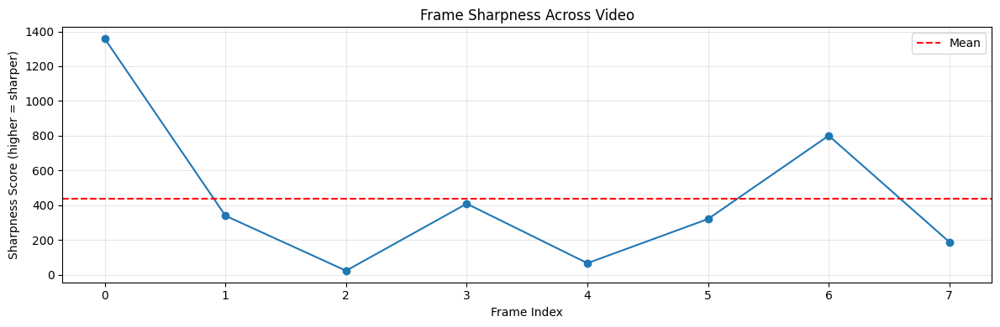

Sharpness Consistency: Inconsistent
Inconsistent sharpness may indicate AI generation or quality issues


In [10]:
# Plot sharpness consistency
if "blur_consistency" in report["stages"]:
    blur_data = report["stages"]["blur_consistency"]
    
    plt.figure(figsize=(12, 4))
    plt.plot(blur_data["sharpness_scores"], marker='o')
    plt.axhline(y=np.mean(blur_data["sharpness_scores"]), color='r', linestyle='--', label='Mean')
    plt.title('Frame Sharpness Across Video')
    plt.xlabel('Frame Index')
    plt.ylabel('Sharpness Score (higher = sharper)')
    plt.legend()
    plt.grid(True, alpha=0.3)
    plt.tight_layout()
    plt.show()
    
    print(f"Sharpness Consistency: {blur_data['consistency']}")
    print(blur_data['interpretation'])

## Display Original Video

View the video being analyzed:

In [11]:
# Display the video in the notebook
if Path(video_to_analyze).exists():
    display(Video(video_to_analyze, width=640, embed=True))
else:
    print(f"Video not found: {video_to_analyze}")

---

## Interpretation Guide

### Understanding the Results

**High Likelihood of AI Generation** if:
- Multiple artifacts detected in frames (warping, blurring, unnatural patterns)
- Temporal inconsistencies (objects morphing, identity changes)
- Anatomical impossibilities (extra fingers, distorted faces)
- Physics violations (impossible shadows, lighting)
- Low temporal consistency scores
- Metadata matches AI generation patterns

**Medium Likelihood** if:
- Some artifacts present but could be compression
- Minor inconsistencies that might be natural
- Mixed technical indicators

**Low Likelihood** if:
- Clean, consistent frames
- Natural motion and physics
- High temporal consistency
- Typical camera metadata present
- No significant artifacts detected

### Common AI Video Artifacts

1. **Morphing**: Objects or people gradually changing shape
2. **Temporal Instability**: Background elements appearing/disappearing
3. **Warping**: Distortions around edges and boundaries
4. **Identity Issues**: Faces or objects not maintaining consistent features
5. **Physics Violations**: Impossible shadows, reflections, or movements
6. **Text Corruption**: Garbled or nonsensical text

### Limitations

- **Evolving Technology**: AI generation improves rapidly
- **Compression Artifacts**: Can mimic AI artifacts
- **False Positives**: Heavily edited real videos may show indicators
- **Context Matters**: Consider source, purpose, and plausibility
- **Expert Review**: Always recommended for important determinations

---

**Remember**: This tool provides analysis to assist human judgment, not replace it.